In [1]:
%matplotlib widget
import starepandas
import modreaders
import glob
import multiprocessing
import itertools
import pandas
import pickle
import numpy
import postgis
import sqlalchemy
import contextily
import matplotlib.pyplot as plt
import geopandas
import spires
import scipy
import copy

# Load cells

In [2]:
# Reds Lake: 
x = 1373; y = 566
# Cues
#x = 1379; y = 565

In [3]:
user = 'spires_rw'
pwd = 'spiresrw'
host= 'localhost'
db_name = 'spires'
uri = f'postgresql+psycopg2://{user}:{pwd}@{host}/{db_name}'

engine = sqlalchemy.create_engine(uri)

In [4]:
cells = postgis.read('cells', con=engine)

In [5]:
cells = geopandas.GeoDataFrame(cells)
cell = cells[(cells.x==x) & (cells.y==y)]

# Load MOD09GA

In [6]:
files_2021_2 = sorted(glob.glob('/tablespace/spires/mod09ga/MOD09GA.A20212*'))
files_2021_3 = sorted(glob.glob('/tablespace/spires/mod09ga/MOD09GA.A20213*'))
files_2022 = sorted(glob.glob('/tablespace/spires/mod09ga/MOD09GA.A2022*'))

file_names = files_2021_2 + files_2021_3 + files_2022

In [7]:
x_min = 1370
x_max = 1380
y_min = 560
y_max = 570
bbox = (x_min, x_max, y_min, y_max)

In [8]:
%%time
n_processes = 64
with multiprocessing.Pool(processes=n_processes) as pool:
    mod09ga = pool.starmap(modreaders.read_mod09ga, zip(file_names, itertools.repeat(bbox)))
mod09ga = pandas.concat(mod09ga)
mod09ga.reset_index(drop=True, inplace=True)

CPU times: user 620 ms, sys: 6.73 s, total: 7.35 s
Wall time: 5min 29s


In [9]:
mod09ga_cell = mod09ga[(mod09ga.x==x) & (mod09ga.y==y)]

# Load MOD09

In [10]:
with open('/tablespace/spires/mod09.pickle', 'rb') as f:
    mod09 = pickle.load(f)
    
mod09.sort_values('ts_start', inplace=True)
mod09.set_index('ts_start', inplace=True)
mod09 = mod09.loc['2021-07-20':'2022-09-15']
mod09.reset_index(inplace=True)

In [11]:
def find_ifov(ifovs, spectrum):
    if isinstance(spectrum, pandas.DataFrame) or isinstance(spectrum, pandas.Series):   
        spectrum = [spectrum['sur_refl_b01_1'], spectrum['sur_refl_b02_1'], spectrum['sur_refl_b03_1'], spectrum['sur_refl_b04_1'], 
                    spectrum['sur_refl_b05_1'], spectrum['sur_refl_b06_1'], spectrum['sur_refl_b07_1']]    
    
    rows = ifovs[(numpy.isclose(ifovs['500m Surface Reflectance Band 1'], spectrum[0])) & 
                 (numpy.isclose(ifovs['500m Surface Reflectance Band 2'], spectrum[1])) & 
                 (numpy.isclose(ifovs['500m Surface Reflectance Band 3'], spectrum[2])) & 
                 (numpy.isclose(ifovs['500m Surface Reflectance Band 4'], spectrum[3])) & 
                 (numpy.isclose(ifovs['500m Surface Reflectance Band 5'], spectrum[4])) & 
                 (numpy.isclose(ifovs['500m Surface Reflectance Band 6'], spectrum[5])) & 
                 (numpy.isclose(ifovs['500m Surface Reflectance Band 7'], spectrum[6])) ]
    return rows

selected = []
for index, row in mod09ga_cell.iterrows():    
    selected.append(find_ifov(mod09, row))

selected = pandas.concat(selected)

In [12]:
def add_ndvi(df):
    ndvi = (df['500m Surface Reflectance Band 2'] - df['500m Surface Reflectance Band 1'])/(df['500m Surface Reflectance Band 2'] + df['500m Surface Reflectance Band 1'])
    df['ndvi'] = ndvi
    
def add_ndsi(df):
    ndsi = (df['500m Surface Reflectance Band 4'] - df['500m Surface Reflectance Band 6'])/(df['500m Surface Reflectance Band 4'] + df['500m Surface Reflectance Band 6'])
    df['ndsi'] = ndsi
    
def spectrum(df):    
    spectrum = df[['500m Surface Reflectance Band 1', 
                   '500m Surface Reflectance Band 2',
                   '500m Surface Reflectance Band 3',
                   '500m Surface Reflectance Band 4',
                   '500m Surface Reflectance Band 5',
                   '500m Surface Reflectance Band 6',
                   '500m Surface Reflectance Band 7']].to_numpy()
    return spectrum

add_ndsi(selected)
add_ndvi(selected)

# Plotting their stupid footprints

In [13]:
selected['ellipse_sids'] = starepandas.io.granules.modis.make_ellipse_sids(selected,n_partitions=32, level=19, crs=3310, modis_resolution=500)
selected['ellipse_trixels'] = selected.set_sids('ellipse_sids').make_trixels(n_partitions=32)

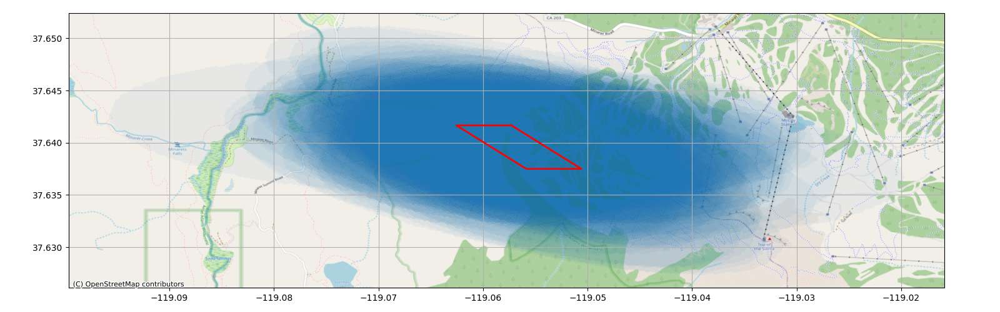

In [14]:
fig = plt.figure(figsize=(16, 5), dpi=100)
ax = fig.add_subplot()
fig.tight_layout()

ax.grid(True)
ax.ticklabel_format(useOffset=False)

selected.set_geometry('ellipse_trixels').plot(ax=ax, zorder=1, linewidth=0.5, trixels=False, boundary=False, alpha=0.051)
cell['polygons_4326'].boundary.plot(ax=ax,  color='r', zorder=10, linewidth=2)

contextily.add_basemap(ax, source=contextily.providers.OpenStreetMap.Mapnik, crs=4326)

# Calculating fSCA

In [15]:
gt = pandas.read_csv('data/202210081952CUES_query.csv', parse_dates=['MeasDateTime'])
gt.set_index('MeasDateTime', inplace=True)

In [16]:
lut = spires.load_lut('data/LUT_MODIS.mat')
r0_grid_raw = scipy.io.loadmat('data/h08v05_R0.mat')['R0']
r0_cell = r0_grid_raw[x, y]

In [17]:
s = copy.copy(selected)

In [18]:
shade = numpy.zeros(7)

results_grid = []

for idx, row in s.iterrows():
    r_spectrum = spectrum(row)
    solar_z = row['SolarZenith']        
    res_grid, model_refl = spires.speedy_invert(lut, r_spectrum, r0_cell, solar_z, shade, mode=4)            
    results_grid.append(res_grid.x)    
    
s['fSCA_grid'] = numpy.array(results_grid).T[0].T

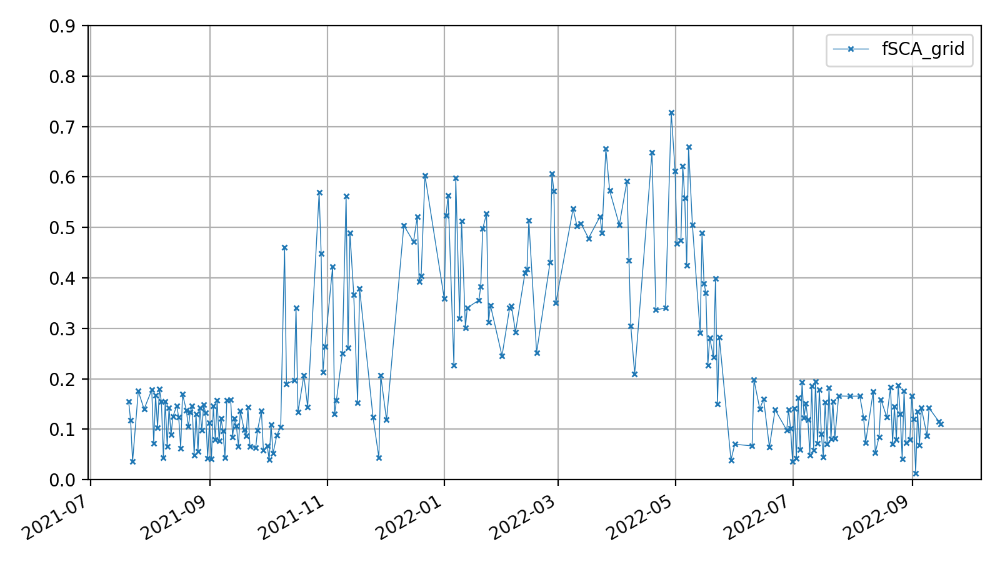

In [19]:
#fig = plt.figure(figsize=(16, 9), dpi=100)
fig = plt.figure(figsize=(8, 4.5), dpi=200)
ax = fig.add_subplot()

ax.ticklabel_format(useOffset=False)

df = pandas.DataFrame(s[(s.SensorZenith<70) &  (s.cloud_internal==False)])
df['ts_start'] = pandas.to_datetime(df['ts_start'])
df.set_index('ts_start', inplace=True)

df.plot(ax=ax, y='fSCA_grid',  marker='x', linewidth=0.5, markersize=3)
#df.plot(ax=ax, y='ndsi', x='ts_start',  rot=90, marker='x', linewidth=0.5, markersize=3)
#df.plot(ax=ax, y='ndvi', x='ts_start', rot=90, marker='x', linewidth=0.5, markersize=3)


#gt.plot(ax=ax, y='snow depth', secondary_y=True, linewidth=0, color='orange')

#ax.ticklabel_format(useOffset=False)
#gt.plot(ax=ax, y='snow depth', secondary_y=True)

ax.set_xlabel('')
ax.set_ylim(0, 0.9)
fig.tight_layout()

ax.grid(True)

/tmp/ipykernel_2508923/3696430652.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df.resample('7d').mean().dropna().plot(y='fSCA_grid',  marker='x', linewidth=0.5, markersize=3, color='red')


<AxesSubplot: xlabel='ts_start'>

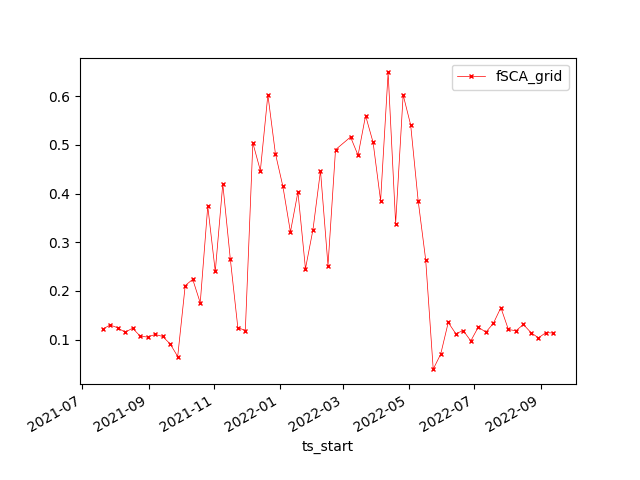

In [20]:
df.resample('7d').mean().dropna().plot(y='fSCA_grid',  marker='x', linewidth=0.5, markersize=3, color='red')

# STARE

In [21]:
with open('/tablespace/spires/r0/r0_stare17_3.pickle', 'rb') as f:
    r0_stare = pickle.load(f)

In [51]:
location = geopandas.points_from_xy([-119.056722], [37.639810], crs=4326) # Reds
#location = geopandas.points_from_xy([-119.029128], [37.643071], crs=4326) # cues
location = starepandas.STAREDataFrame(geometry=location)
location.set_sids(location.make_sids(level=15), inplace=True)
location.add_trixels(inplace=True)
sid = location.sids.iloc[0]

In [49]:
location = geopandas.read_file('data/mammoth.gpkg')
location = location[location.name=='outpost']
location = starepandas.STAREDataFrame(location)
location.set_sids(location.make_sids(level=19), inplace=True)
location.add_trixels(inplace=True)
sid = location.sids.iloc[0]

In [52]:
s2 = mod09[mod09.to_stare_level(19).stare_intersects(sid)]

results_s = []
for idx, row in s2.iterrows():
    r_spectrum = spectrum(row)
    solar_z = row['SolarZenith']            
                    
    candidates = r0_stare[r0_stare.sids==row.sids17]
    r0_best = candidates.iloc[(candidates.scan_pos-row.scan_pos).abs().argsort().iloc[:1]]        
    r0_best = spectrum(r0_best)[0]
     
    res_stare, model_refl = spires.speedy_invert(lut, r_spectrum, r0_best, solar_z, shade, mode=4)        
    results_s.append(res_stare.x)

In [53]:
df2 = pandas.DataFrame(s2)
df2['fSCA_stare'] = numpy.array(results_s).T[0].T
df2 = df2[(df2.SensorZenith<65) & (df2.cloud==0) & (df2.cloud_internal==0)]
add_ndsi(df2)
add_ndvi(df2)
df2 = df2.groupby(df2.ts_start.dt.date).mean().reset_index()
df2['ts_start'] = pandas.to_datetime(df2['ts_start'])
df2.set_index('ts_start', inplace=True)

/tmp/ipykernel_2508923/4200636443.py:6: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df2 = df2.groupby(df2.ts_start.dt.date).mean().reset_index()


# VNP09

In [26]:
def vnp_spectrum(df):    
    spectrum = df[['750m Surface Reflectance Band M5', 
                   '750m Surface Reflectance Band M7',
                   '750m Surface Reflectance Band M3',
                   '750m Surface Reflectance Band M4',
                   '750m Surface Reflectance Band M8',
                   '750m Surface Reflectance Band M10',
                   '750m Surface Reflectance Band M11']].to_numpy()
    return spectrum

In [27]:
with open('/tablespace/spires/r0/vnp/r0_vnp_stare17_4.pickle', 'rb') as f:
    r0_vnp_stare = pickle.load(f)

In [28]:
with open('/tablespace/spires/vnp09.pickle', 'rb') as f:
    vnp09 = pickle.load(f)
    
vnp09.sort_values('ts_start', inplace=True)
vnp09.set_index('ts_start', inplace=True)
vnp09 = vnp09.loc['2021-07-20':'2022-09-15']
vnp09.reset_index(inplace=True)

In [29]:
def add_ndvi_vnp(df):
    ndvi = (df['750m Surface Reflectance Band M7'] - df['750m Surface Reflectance Band M5'])/(df['750m Surface Reflectance Band M7'] + df['750m Surface Reflectance Band M5'])
    df['ndvi'] = ndvi
    
def add_ndsi_vnp(df):
    ndsi = (df['750m Surface Reflectance Band M4'] - df['750m Surface Reflectance Band M10'])/(df['750m Surface Reflectance Band M4'] + df['750m Surface Reflectance Band M10'])
    df['ndsi'] = ndsi

add_ndsi_vnp(vnp09)
add_ndvi_vnp(vnp09)

In [30]:
s3 = vnp09[vnp09.to_stare_level(19).stare_intersects(sid)]

In [45]:
results_s = []
for idx, row in s3.iterrows():
    r_spectrum = vnp_spectrum(row)
    solar_z = row['solar_zenith']            
                    
    candidates = r0_vnp_stare[r0_vnp_stare.sids==row.sids17]
    #candidates = r0_stare[r0_stare.sids==row.sids17]
    r0_best = candidates.iloc[(candidates.scan_pos-row.scan_pos).abs().argsort().iloc[:1]]        
    r0_best = vnp_spectrum(r0_best)[0]
     
    res_stare, model_refl = spires.speedy_invert(lut, r_spectrum, r0_best, solar_z, shade, mode=4)        
    if res_stare.x[0] ==0.0:        
        res_stare, model_refl = spires.speedy_invert(lut, r_spectrum, r0_best, solar_z, shade, mode=3)                
    results_s.append(res_stare.x)

KeyboardInterrupt: 

In [41]:
df3 = pandas.DataFrame(s3)
df3['fSCA_stare'] = numpy.array(results_s).T[0].T
df3 = df3[(df3.sensor_zenith<55) & (df3.cloud=='00')]
add_ndsi_vnp(df3)
add_ndvi_vnp(df3)
df3 = df3.groupby(df3.ts_start.dt.date).mean().reset_index()
df3['ts_start'] = pandas.to_datetime(df3['ts_start'])
df3.set_index('ts_start', inplace=True)

/tmp/ipykernel_2508923/2032626602.py:6: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df3 = df3.groupby(df3.ts_start.dt.date).mean().reset_index()


# Plotting

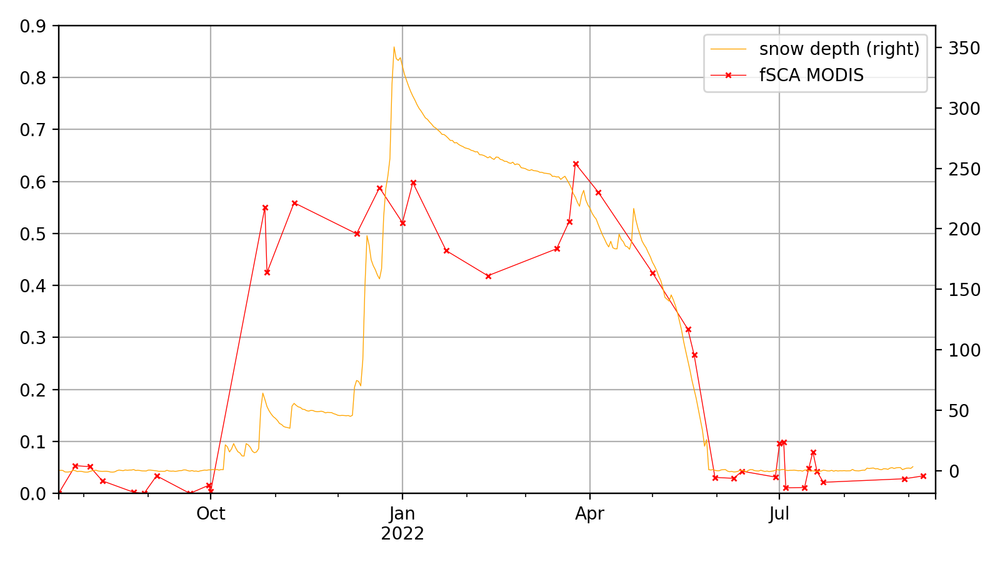

In [54]:
fig = plt.figure(figsize=(8, 4.5), dpi=200)
ax = fig.add_subplot()

ax.ticklabel_format(useOffset=False)

gt.plot(ax=ax, y='snow depth', secondary_y=True, linewidth=0.5, color='orange')

df2.rename(columns={'fSCA_stare': 'fSCA MODIS'}).plot(ax=ax, y='fSCA MODIS',  marker='x', linewidth=0.5, markersize=3, color='red')
#df3.rename(columns={'fSCA_stare': 'fSCA VIIRS'}).plot(ax=ax, y='fSCA VIIRS',  marker='x', linewidth=0.5, markersize=3, color='red')

#pandas.concat([df2['fSCA_stare'], df3['fSCA_stare']], names=['fsca']).sort_index().resample('7d').mean().dropna().plot(ax=ax, marker='x', label='fSCA MODIS+VIIRS', linewidth=1, markersize=3, legend=True)


ax.set_xlabel('')
ax.set_ylim(0, 0.9)
fig.tight_layout()

ax.grid(True)

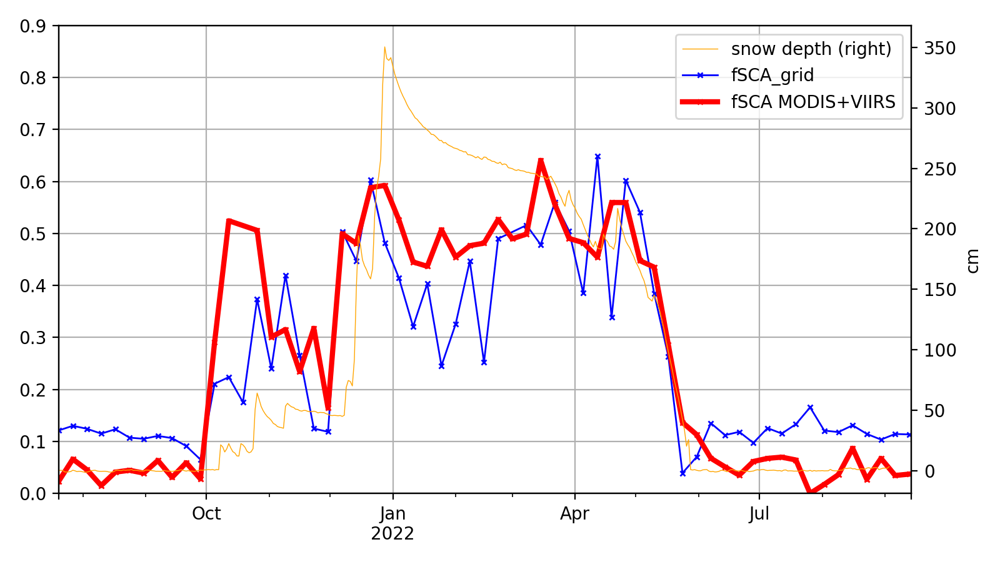

In [35]:
fig = plt.figure(figsize=(8, 4.5), dpi=200)
ax = fig.add_subplot()

ax.ticklabel_format(useOffset=False)

gt.plot(ax=ax, y='snow depth', secondary_y=True, linewidth=0.5, color='orange')
ax.right_ax.set_ylabel('cm')

df['fSCA_grid'].sort_index().resample('7d').mean().dropna().plot(ax=ax, marker='x', linewidth=1, markersize=3, legend=True, color='blue')
pandas.concat([df2['fSCA_stare'], df3['fSCA_stare']], names=['fsca']).sort_index().resample('7d').mean().dropna().plot(ax=ax, marker='x', label='fSCA MODIS+VIIRS', linewidth=3, markersize=3, legend=True, color='red')

ax.set_xlabel('')
ax.set_ylim(0, 0.9)
fig.tight_layout()

ax.grid(True)

In [36]:
ax.get_xlim()

(18828.0, 19249.0)

/home/griessbaum/.conda/envs/stare/lib/python3.10/site-packages/geopandas/geodataframe.py:1472: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


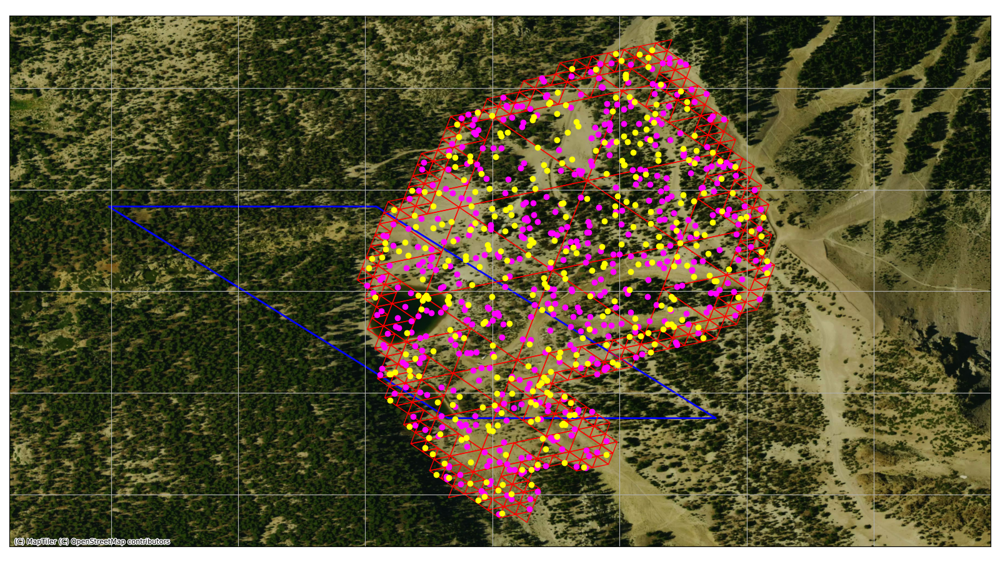

In [37]:
fig = plt.figure(figsize=(16, 9), dpi=100)
ax = fig.add_subplot()

s3['center_point'] = geopandas.points_from_xy(s3.lon, s3.lat)
plt.tick_params(left = False, right = False , labelleft = False, labelbottom = False, bottom = False)

ax.grid(True)
ax.ticklabel_format(useOffset=False)

cell['polygons_4326'].exterior.plot(ax=ax,  color='b', zorder=1, linewidth=2)
#s.center_point.plot(ax=ax, color='blue')

s2.center_point.plot(ax=ax, color='magenta', zorder=2)
s3.center_point.plot(ax=ax, color='yellow', zorder=2)
location.plot(ax=ax, color='r', linewidth=1, zorder=1)
ax.set_xlim(-119.0645, -119.0452)
#contextily.add_basemap(ax, source=contextily.providers.OpenStreetMap.Mapnik, crs=4326)
#p = contextily.providers.MapTiler.Hybrid()
p = contextily.providers.MapTiler.Satellite(key='s2uAyyJ4WmUzIH8OdujS')
contextily.add_basemap(ax, source=p, crs=4326 )

fig.tight_layout()

<AxesSubplot: >

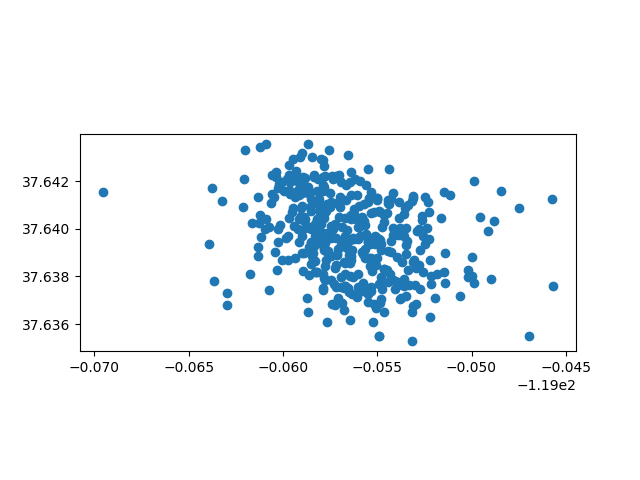

In [38]:
selected['center_point'].plot()